In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [6]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175,0.000955,0

In [8]:
importlib.reload(params) #####
importlib.reload(strategies) #####

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()

for day, df_day in tqdm(groups, desc="Smoothing+Generate+Simulate", total=total_days):
    df_actions = strategies.generate_tradact_ema921(
        df              = df_day,
        col_signal      = "ema_9",
        sign_thresh     = "ema_21",
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        rsi_thresh      = params.rsi_thresh_tick,
        sellmin_idx     = params.sellmin_idx_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            sellmin_idx = params.sellmin_idx_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Smoothing+Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622


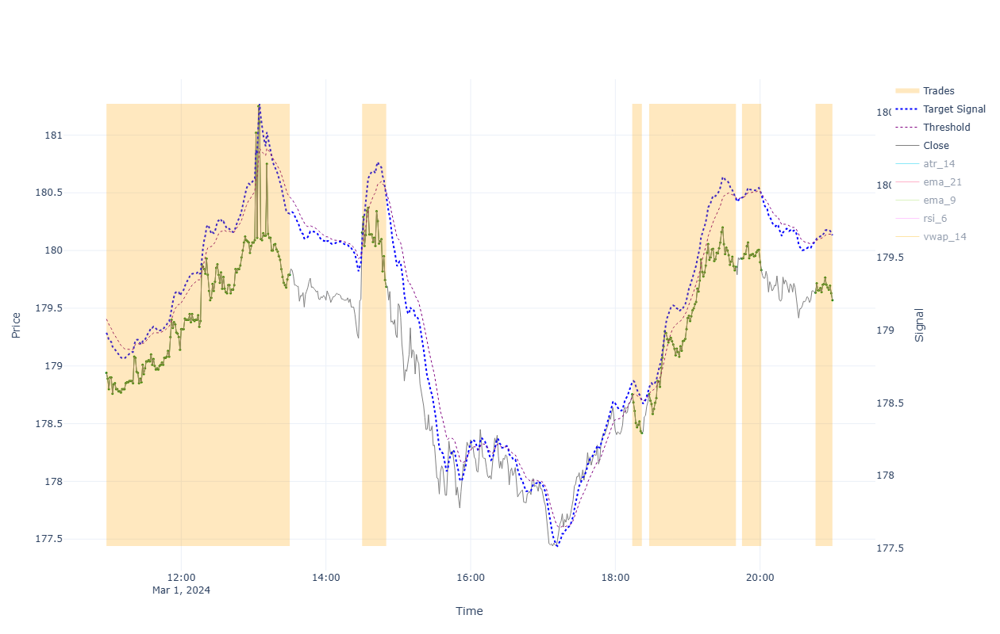


=== Performance for 2024-03-01 00:00:00 ===

BUY&HOLD:
  Bid(0) 179.534 - Ask(0) 179.826 - Fee(0) [0.004+0.029] = -0.325
TRADES:
  Bid(1) 179.754 - Ask(1) 180.634 - Fee(1) [0.0+0.029] = -0.909
  Bid(2) 179.651 - Ask(2) 180.191 - Fee(2) [0.004+0.029] = -0.573
  Bid(3) 178.385 - Ask(3) 178.791 - Fee(3) [0.004+0.029] = -0.439
  Bid(4) 179.822 - Ask(4) 178.791 - Fee(4) [0.004+0.029] = 0.999
  Bid(5) 179.794 - Ask(5) 179.966 - Fee(5) [0.004+0.029] = -0.205
  Bid(6) 179.534 - Ask(6) 179.671 - Fee(6) [0.004+0.0] = -0.141
STRATEGY:
  Trade(1) -0.909 + Trade(2) -0.573 + Trade(3) -0.439 + Trade(4) 0.999 + Trade(5) -0.205 + Trade(6) -0.141 = -1.268

------------------------------------------------------------------------------------------------------------------------



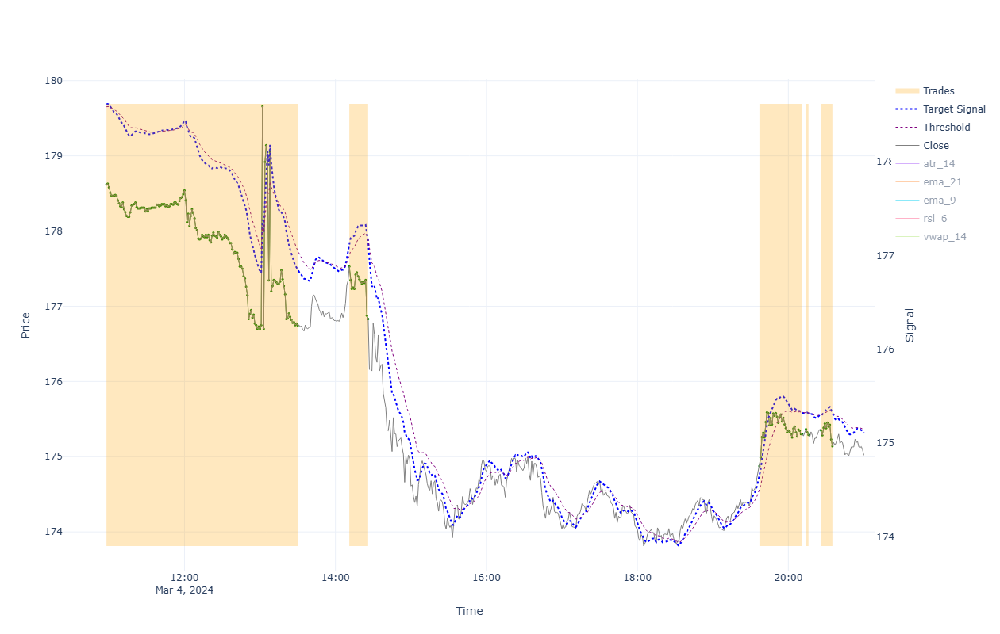


=== Performance for 2024-03-04 00:00:00 ===

BUY&HOLD:
  Bid(0) 174.985 - Ask(0) 176.78 - Fee(0) [0.004+0.028] = -1.828
TRADES:
  Bid(1) 176.71 - Ask(1) 179.534 - Fee(1) [0.0+0.029] = -2.853
  Bid(2) 176.795 - Ask(2) 177.566 - Fee(2) [0.004+0.029] = -0.803
  Bid(3) 175.265 - Ask(3) 174.91 - Fee(3) [0.004+0.028] = 0.323
  Bid(4) 175.255 - Ask(4) 175.4 - Fee(4) [0.004+0.028] = -0.178
  Bid(5) 175.105 - Ask(5) 175.386 - Fee(5) [0.004+0.028] = -0.313
STRATEGY:
  Trade(1) -2.853 + Trade(2) -0.803 + Trade(3) 0.323 + Trade(4) -0.178 + Trade(5) -0.313 = -3.824

------------------------------------------------------------------------------------------------------------------------



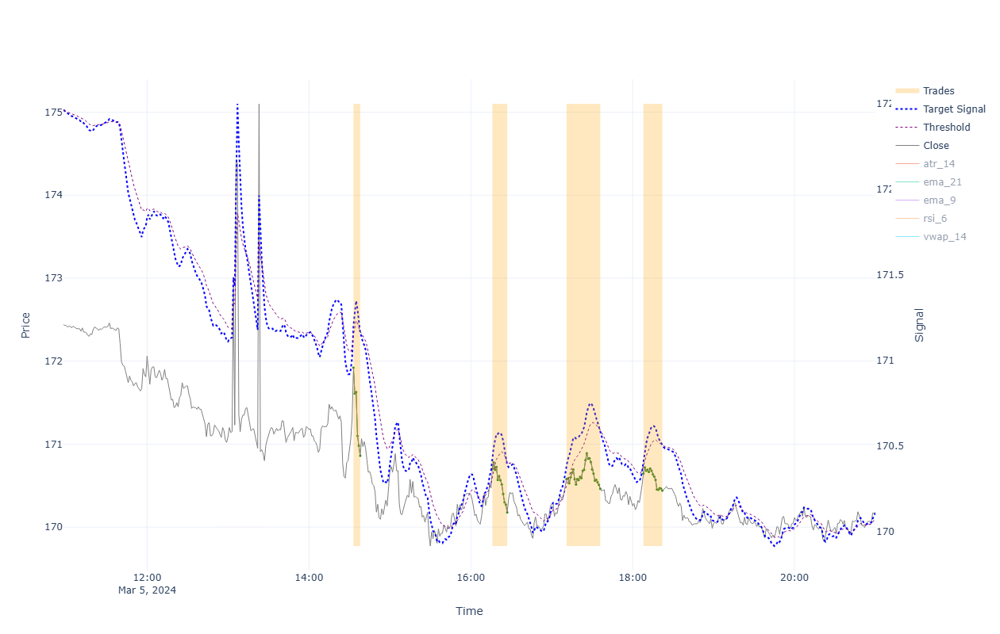


=== Performance for 2024-03-05 00:00:00 ===

BUY&HOLD:
  Bid(0) 170.136 - Ask(0) 171.144 - Fee(0) [0.004+0.028] = -1.04
TRADES:
  Bid(1) 170.826 - Ask(1) 171.954 - Fee(1) [0.004+0.028] = -1.16
  Bid(2) 170.144 - Ask(2) 170.736 - Fee(2) [0.004+0.028] = -0.624
  Bid(3) 170.428 - Ask(3) 170.614 - Fee(3) [0.004+0.028] = -0.218
  Bid(4) 170.406 - Ask(4) 170.679 - Fee(4) [0.004+0.028] = -0.305
STRATEGY:
  Trade(1) -1.16 + Trade(2) -0.624 + Trade(3) -0.218 + Trade(4) -0.305 = -2.307

------------------------------------------------------------------------------------------------------------------------



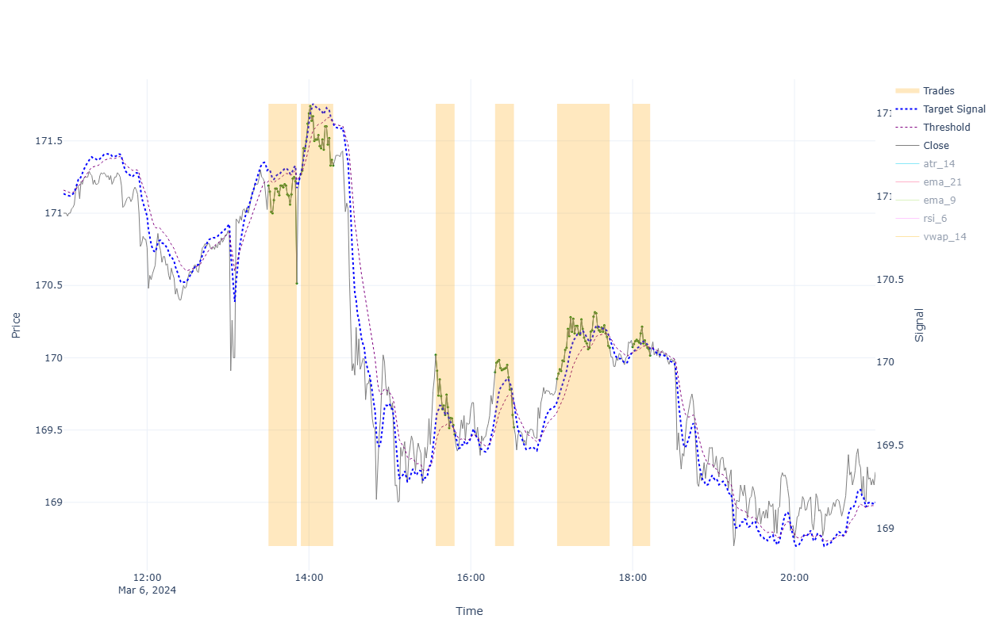


=== Performance for 2024-03-06 00:00:00 ===

BUY&HOLD:
  Bid(0) 169.176 - Ask(0) 171.224 - Fee(0) [0.004+0.028] = -2.08
TRADES:
  Bid(1) 170.481 - Ask(1) 171.224 - Fee(1) [0.004+0.028] = -0.775
  Bid(2) 171.296 - Ask(2) 171.304 - Fee(2) [0.004+0.028] = -0.04
  Bid(3) 169.436 - Ask(3) 170.054 - Fee(3) [0.004+0.028] = -0.649
  Bid(4) 169.486 - Ask(4) 169.934 - Fee(4) [0.004+0.028] = -0.48
  Bid(5) 170.036 - Ask(5) 169.889 - Fee(5) [0.004+0.028] = 0.115
  Bid(6) 169.982 - Ask(6) 170.109 - Fee(6) [0.004+0.028] = -0.159
STRATEGY:
  Trade(1) -0.775 + Trade(2) -0.04 + Trade(3) -0.649 + Trade(4) -0.48 + Trade(5) 0.115 + Trade(6) -0.159 = -1.988

------------------------------------------------------------------------------------------------------------------------



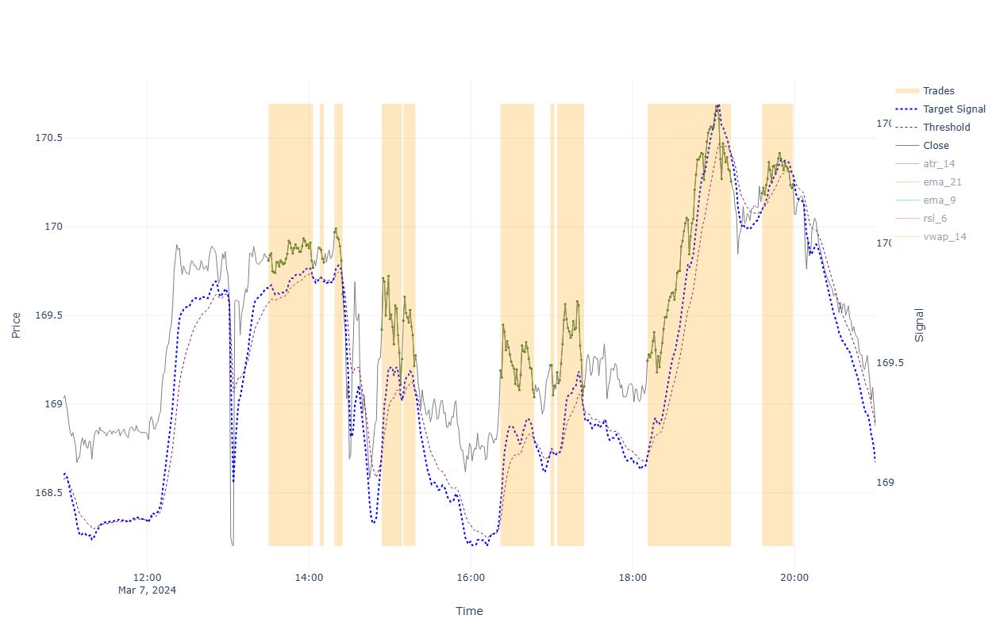


=== Performance for 2024-03-07 00:00:00 ===

BUY&HOLD:
  Bid(0) 168.846 - Ask(0) 169.844 - Fee(0) [0.004+0.027] = -1.029
TRADES:
  Bid(1) 169.736 - Ask(1) 169.844 - Fee(1) [0.004+0.028] = -0.14
  Bid(2) 169.766 - Ask(2) 169.914 - Fee(2) [0.004+0.028] = -0.18
  Bid(3) 169.586 - Ask(3) 170.004 - Fee(3) [0.004+0.028] = -0.45
  Bid(4) 169.221 - Ask(4) 169.454 - Fee(4) [0.004+0.028] = -0.264
  Bid(5) 169.241 - Ask(5) 169.504 - Fee(5) [0.004+0.028] = -0.294
  Bid(6) 169.006 - Ask(6) 169.224 - Fee(6) [0.004+0.028] = -0.249
  Bid(7) 169.07 - Ask(7) 169.254 - Fee(7) [0.004+0.028] = -0.215
  Bid(8) 169.066 - Ask(8) 169.214 - Fee(8) [0.004+0.028] = -0.179
  Bid(9) 170.221 - Ask(9) 169.279 - Fee(9) [0.004+0.028] = 0.91
  Bid(10) 170.206 - Ask(10) 170.224 - Fee(10) [0.004+0.028] = -0.05
STRATEGY:
  Trade(1) -0.14 + Trade(2) -0.18 + Trade(3) -0.45 + Trade(4) -0.264 + Trade(5) -0.294 + Trade(6) -0.249 + Trade(7) -0.215 + Trade(8) -0.179 + Trade(9) 0.91 + Trade(10) -0.05 = -1.111

-------------------

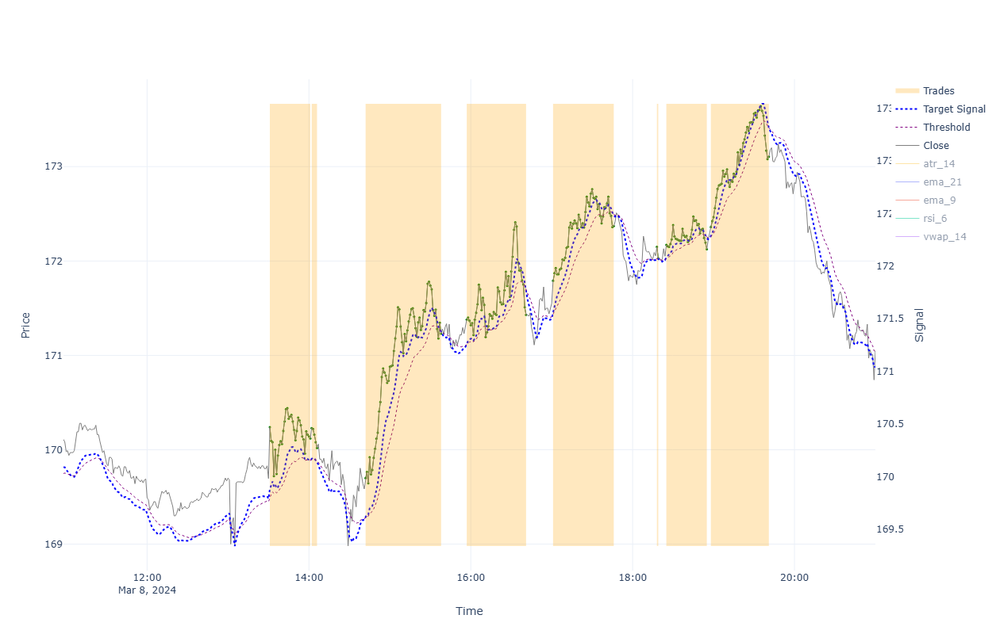


=== Performance for 2024-03-08 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.021 - Ask(0) 169.729 - Fee(0) [0.004+0.028] = 1.26
TRADES:
  Bid(1) 170.086 - Ask(1) 170.274 - Fee(1) [0.004+0.028] = -0.22
  Bid(2) 169.986 - Ask(2) 170.264 - Fee(2) [0.004+0.028] = -0.31
  Bid(3) 171.196 - Ask(3) 169.734 - Fee(3) [0.004+0.028] = 1.43
  Bid(4) 171.396 - Ask(4) 171.414 - Fee(4) [0.004+0.028] = -0.05
  Bid(5) 172.336 - Ask(5) 171.824 - Fee(5) [0.004+0.028] = 0.479
  Bid(6) 171.996 - Ask(6) 172.184 - Fee(6) [0.004+0.028] = -0.221
  Bid(7) 172.091 - Ask(7) 172.204 - Fee(7) [0.004+0.028] = -0.146
  Bid(8) 173.07 - Ask(8) 172.394 - Fee(8) [0.004+0.028] = 0.644
STRATEGY:
  Trade(1) -0.22 + Trade(2) -0.31 + Trade(3) 1.43 + Trade(4) -0.05 + Trade(5) 0.479 + Trade(6) -0.221 + Trade(7) -0.146 + Trade(8) 0.644 = 1.606

------------------------------------------------------------------------------------------------------------------------



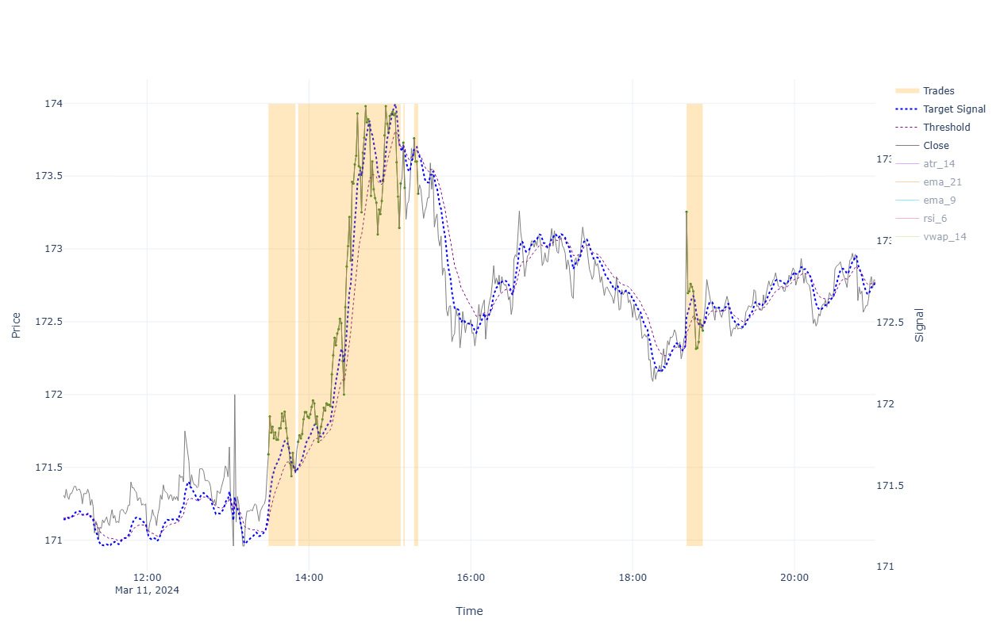


=== Performance for 2024-03-11 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.745 - Ask(0) 171.624 - Fee(0) [0.004+0.028] = 1.089
TRADES:
  Bid(1) 171.446 - Ask(1) 171.624 - Fee(1) [0.004+0.028] = -0.21
  Bid(2) 173.415 - Ask(2) 171.709 - Fee(2) [0.004+0.028] = 1.674
  Bid(3) 173.385 - Ask(3) 173.765 - Fee(3) [0.004+0.028] = -0.412
  Bid(4) 173.345 - Ask(4) 173.795 - Fee(4) [0.004+0.028] = -0.481
  Bid(5) 172.406 - Ask(5) 173.29 - Fee(5) [0.004+0.028] = -0.916
STRATEGY:
  Trade(1) -0.21 + Trade(2) 1.674 + Trade(3) -0.412 + Trade(4) -0.481 + Trade(5) -0.916 = -0.345

------------------------------------------------------------------------------------------------------------------------



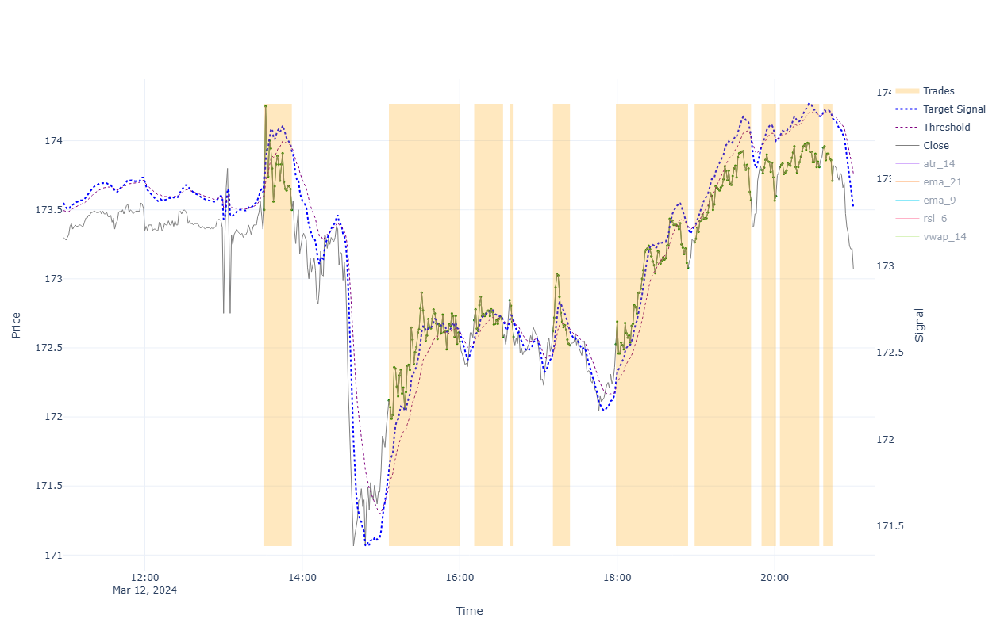


=== Performance for 2024-03-12 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.035 - Ask(0) 173.395 - Fee(0) [0.004+0.028] = -0.391
TRADES:
  Bid(1) 173.465 - Ask(1) 173.535 - Fee(1) [0.004+0.028] = -0.102
  Bid(2) 172.51 - Ask(2) 172.154 - Fee(2) [0.004+0.028] = 0.324
  Bid(3) 172.545 - Ask(3) 172.735 - Fee(3) [0.004+0.028] = -0.221
  Bid(4) 172.545 - Ask(4) 172.88 - Fee(4) [0.004+0.028] = -0.366
  Bid(5) 172.484 - Ask(5) 172.655 - Fee(5) [0.004+0.028] = -0.202
  Bid(6) 173.045 - Ask(6) 172.562 - Fee(6) [0.004+0.028] = 0.451
  Bid(7) 173.535 - Ask(7) 173.298 - Fee(7) [0.004+0.028] = 0.205
  Bid(8) 173.565 - Ask(8) 173.825 - Fee(8) [0.004+0.028] = -0.292
  Bid(9) 173.775 - Ask(9) 173.845 - Fee(9) [0.004+0.028] = -0.102
  Bid(10) 173.675 - Ask(10) 173.985 - Fee(10) [0.004+0.028] = -0.342
STRATEGY:
  Trade(1) -0.102 + Trade(2) 0.324 + Trade(3) -0.221 + Trade(4) -0.366 + Trade(5) -0.202 + Trade(6) 0.451 + Trade(7) 0.205 + Trade(8) -0.292 + Trade(9) -0.102 + Trade(10) -0.342 = -0.647

--------------

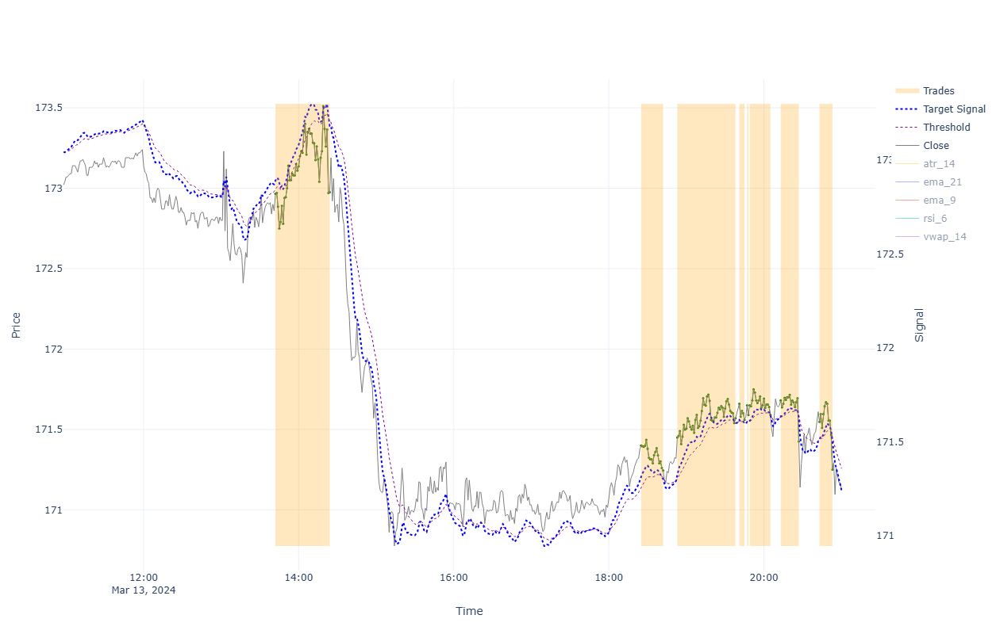


=== Performance for 2024-03-13 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.086 - Ask(0) 172.865 - Fee(0) [0.004+0.028] = -1.811
TRADES:
  Bid(1) 172.94 - Ask(1) 173.0 - Fee(1) [0.004+0.028] = -0.091
  Bid(2) 171.211 - Ask(2) 171.434 - Fee(2) [0.004+0.028] = -0.255
  Bid(3) 171.536 - Ask(3) 171.484 - Fee(3) [0.004+0.028] = 0.02
  Bid(4) 171.526 - Ask(4) 171.694 - Fee(4) [0.004+0.028] = -0.201
  Bid(5) 171.556 - Ask(5) 171.684 - Fee(5) [0.004+0.028] = -0.161
  Bid(6) 171.556 - Ask(6) 171.684 - Fee(6) [0.004+0.028] = -0.161
  Bid(7) 171.391 - Ask(7) 171.714 - Fee(7) [0.004+0.028] = -0.355
  Bid(8) 171.216 - Ask(8) 171.582 - Fee(8) [0.004+0.028] = -0.398
STRATEGY:
  Trade(1) -0.091 + Trade(2) -0.255 + Trade(3) 0.02 + Trade(4) -0.201 + Trade(5) -0.161 + Trade(6) -0.161 + Trade(7) -0.355 + Trade(8) -0.398 = -1.602

------------------------------------------------------------------------------------------------------------------------



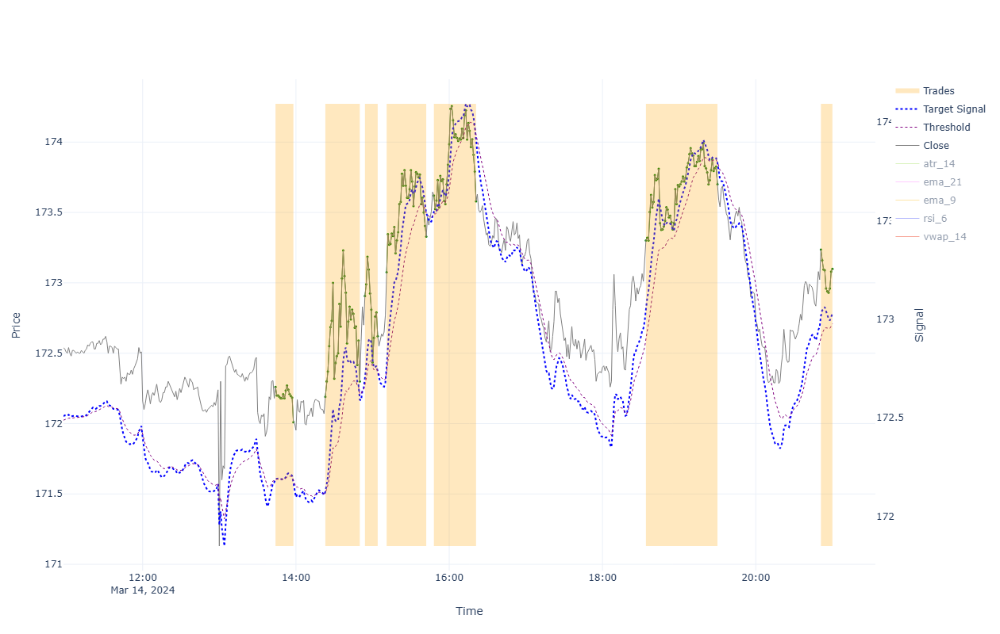


=== Performance for 2024-03-14 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.065 - Ask(0) 172.114 - Fee(0) [0.004+0.028] = 0.919
TRADES:
  Bid(1) 171.976 - Ask(1) 172.294 - Fee(1) [0.004+0.028] = -0.351
  Bid(2) 172.266 - Ask(2) 172.224 - Fee(2) [0.004+0.028] = 0.009
  Bid(3) 172.586 - Ask(3) 172.941 - Fee(3) [0.004+0.028] = -0.386
  Bid(4) 173.294 - Ask(4) 173.111 - Fee(4) [0.004+0.028] = 0.151
  Bid(5) 173.545 - Ask(5) 173.655 - Fee(5) [0.004+0.028] = -0.142
  Bid(6) 173.665 - Ask(6) 173.335 - Fee(6) [0.004+0.028] = 0.298
  Bid(7) 173.065 - Ask(7) 173.271 - Fee(7) [0.004+0.0] = -0.209
STRATEGY:
  Trade(1) -0.351 + Trade(2) 0.009 + Trade(3) -0.386 + Trade(4) 0.151 + Trade(5) -0.142 + Trade(6) 0.298 + Trade(7) -0.209 = -0.63

------------------------------------------------------------------------------------------------------------------------



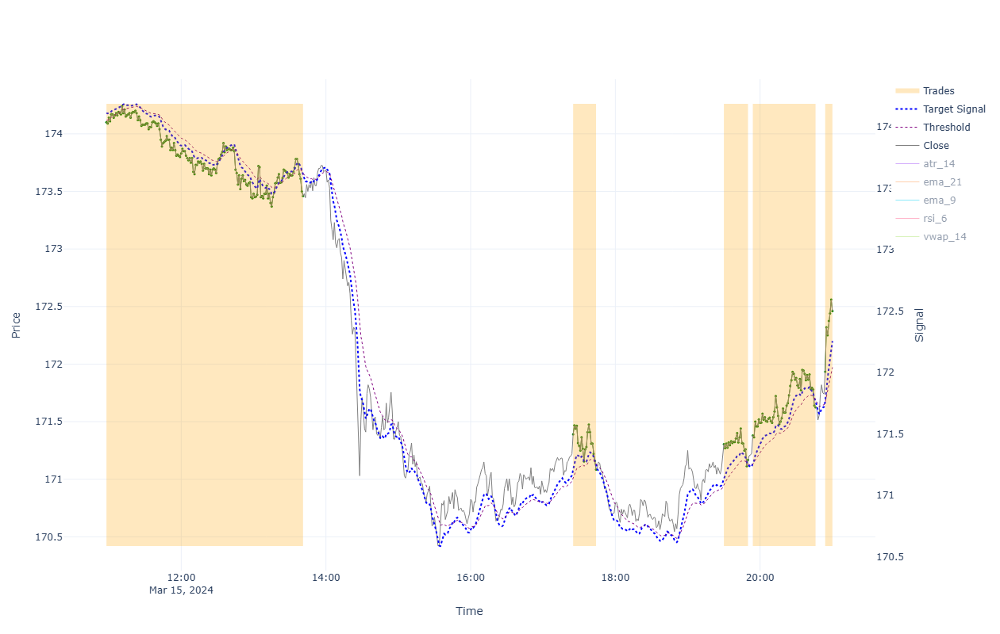


=== Performance for 2024-03-15 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.426 - Ask(0) 173.685 - Fee(0) [0.004+0.028] = -1.291
TRADES:
  Bid(1) 173.425 - Ask(1) 173.065 - Fee(1) [0.0+0.028] = 0.332
  Bid(2) 171.051 - Ask(2) 171.424 - Fee(2) [0.004+0.028] = -0.405
  Bid(3) 171.134 - Ask(3) 171.339 - Fee(3) [0.004+0.028] = -0.237
  Bid(4) 171.591 - Ask(4) 171.414 - Fee(4) [0.004+0.028] = 0.145
  Bid(5) 172.426 - Ask(5) 171.969 - Fee(5) [0.004+0.0] = 0.452
STRATEGY:
  Trade(1) 0.332 + Trade(2) -0.405 + Trade(3) -0.237 + Trade(4) 0.145 + Trade(5) 0.452 = 0.287

------------------------------------------------------------------------------------------------------------------------



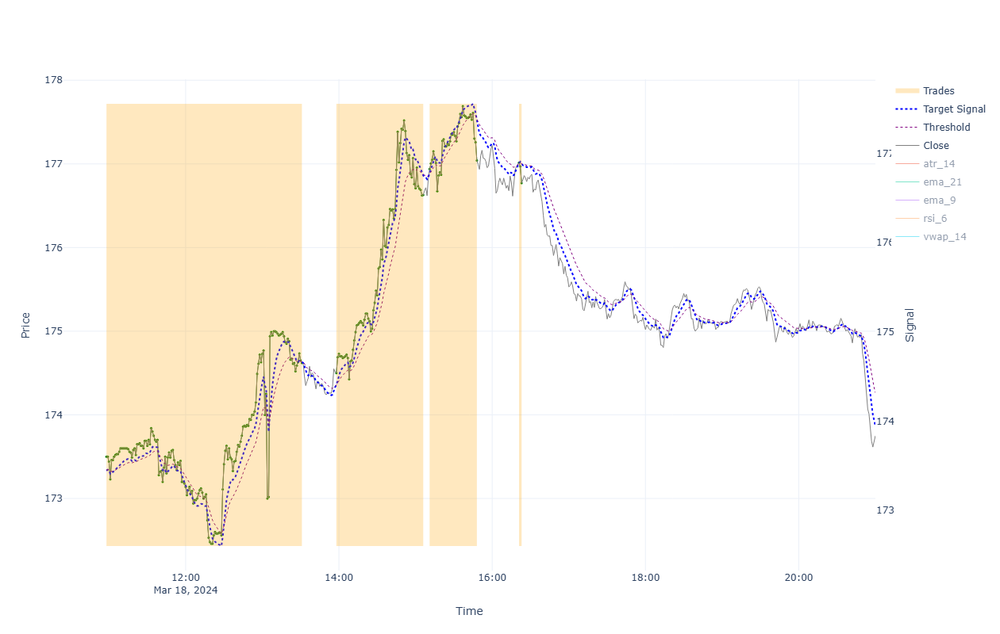


=== Performance for 2024-03-18 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.715 - Ask(0) 174.685 - Fee(0) [0.004+0.028] = -1.002
TRADES:
  Bid(1) 174.585 - Ask(1) 172.426 - Fee(1) [0.0+0.028] = 2.131
  Bid(2) 176.593 - Ask(2) 174.535 - Fee(2) [0.004+0.029] = 2.025
  Bid(3) 177.005 - Ask(3) 176.975 - Fee(3) [0.004+0.029] = -0.003
  Bid(4) 176.735 - Ask(4) 177.05 - Fee(4) [0.004+0.029] = -0.348
STRATEGY:
  Trade(1) 2.131 + Trade(2) 2.025 + Trade(3) -0.003 + Trade(4) -0.348 = 3.805

------------------------------------------------------------------------------------------------------------------------



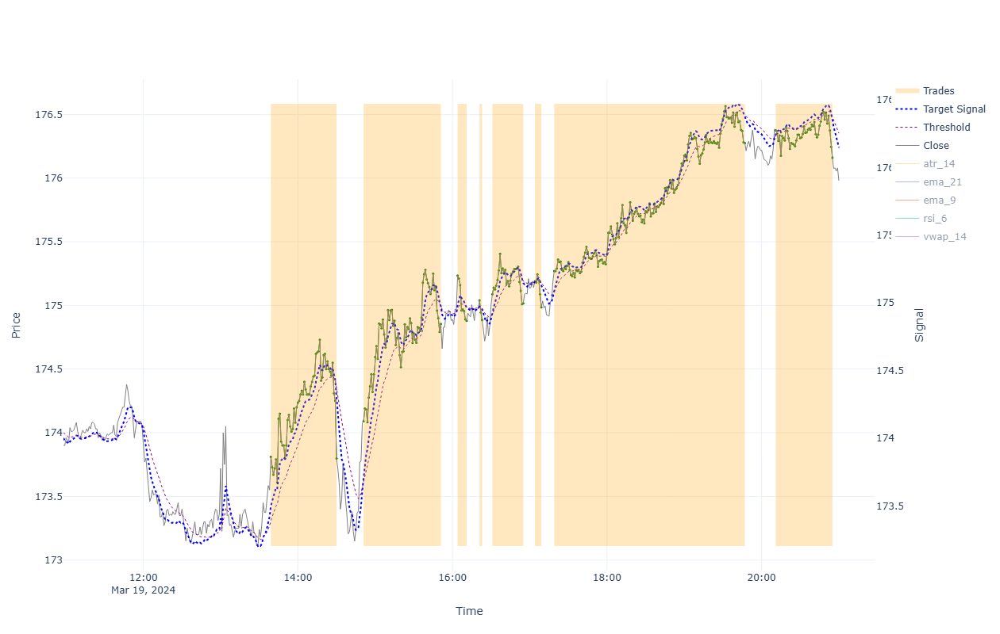


=== Performance for 2024-03-19 00:00:00 ===

BUY&HOLD:
  Bid(0) 175.945 - Ask(0) 173.275 - Fee(0) [0.004+0.028] = 2.638
TRADES:
  Bid(1) 173.763 - Ask(1) 173.845 - Fee(1) [0.004+0.028] = -0.114
  Bid(2) 174.82 - Ask(2) 174.125 - Fee(2) [0.004+0.028] = 0.663
  Bid(3) 174.845 - Ask(3) 175.27 - Fee(3) [0.004+0.028] = -0.457
  Bid(4) 174.85 - Ask(4) 175.075 - Fee(4) [0.004+0.028] = -0.257
  Bid(5) 174.982 - Ask(5) 175.123 - Fee(5) [0.004+0.028] = -0.174
  Bid(6) 174.95 - Ask(6) 175.224 - Fee(6) [0.004+0.028] = -0.306
  Bid(7) 176.24 - Ask(7) 175.305 - Fee(7) [0.004+0.029] = 0.902
  Bid(8) 176.125 - Ask(8) 176.41 - Fee(8) [0.004+0.028] = -0.318
STRATEGY:
  Trade(1) -0.114 + Trade(2) 0.663 + Trade(3) -0.457 + Trade(4) -0.257 + Trade(5) -0.174 + Trade(6) -0.306 + Trade(7) 0.902 + Trade(8) -0.318 = -0.061

------------------------------------------------------------------------------------------------------------------------



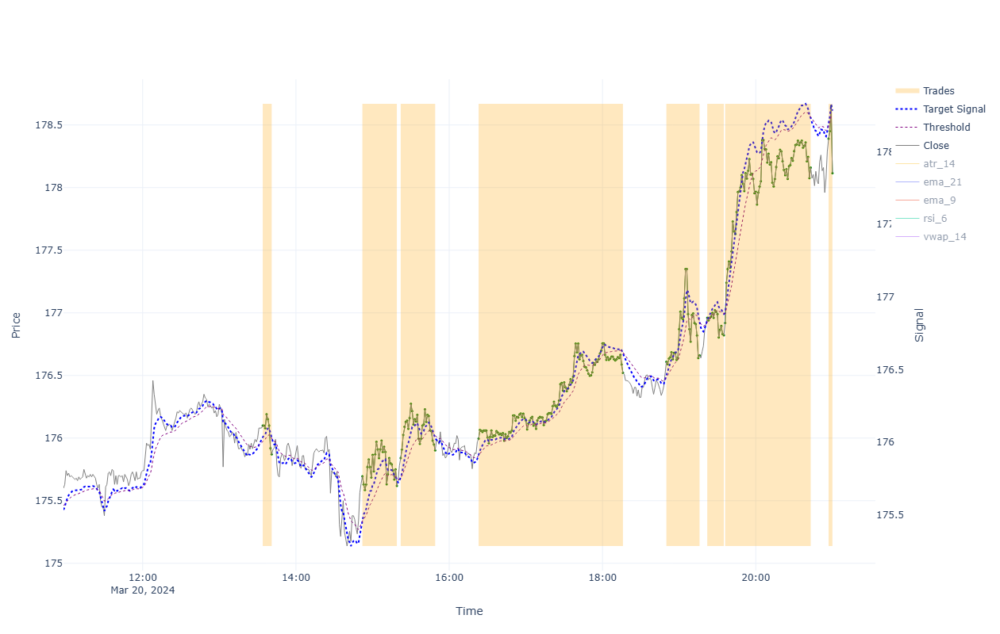


=== Performance for 2024-03-20 00:00:00 ===

BUY&HOLD:
  Bid(0) 178.079 - Ask(0) 176.035 - Fee(0) [0.004+0.029] = 2.011
TRADES:
  Bid(1) 175.835 - Ask(1) 176.135 - Fee(1) [0.004+0.028] = -0.333
  Bid(2) 175.584 - Ask(2) 175.73 - Fee(2) [0.004+0.028] = -0.179
  Bid(3) 175.867 - Ask(3) 175.875 - Fee(3) [0.004+0.028] = -0.04
  Bid(4) 176.485 - Ask(4) 176.03 - Fee(4) [0.004+0.029] = 0.422
  Bid(5) 176.625 - Ask(5) 176.645 - Fee(5) [0.004+0.029] = -0.053
  Bid(6) 176.786 - Ask(6) 176.995 - Fee(6) [0.004+0.029] = -0.242
  Bid(7) 178.124 - Ask(7) 176.955 - Fee(7) [0.004+0.029] = 1.136
  Bid(8) 178.079 - Ask(8) 178.426 - Fee(8) [0.004+0.0] = -0.35
STRATEGY:
  Trade(1) -0.333 + Trade(2) -0.179 + Trade(3) -0.04 + Trade(4) 0.422 + Trade(5) -0.053 + Trade(6) -0.242 + Trade(7) 1.136 + Trade(8) -0.35 = 0.361

------------------------------------------------------------------------------------------------------------------------



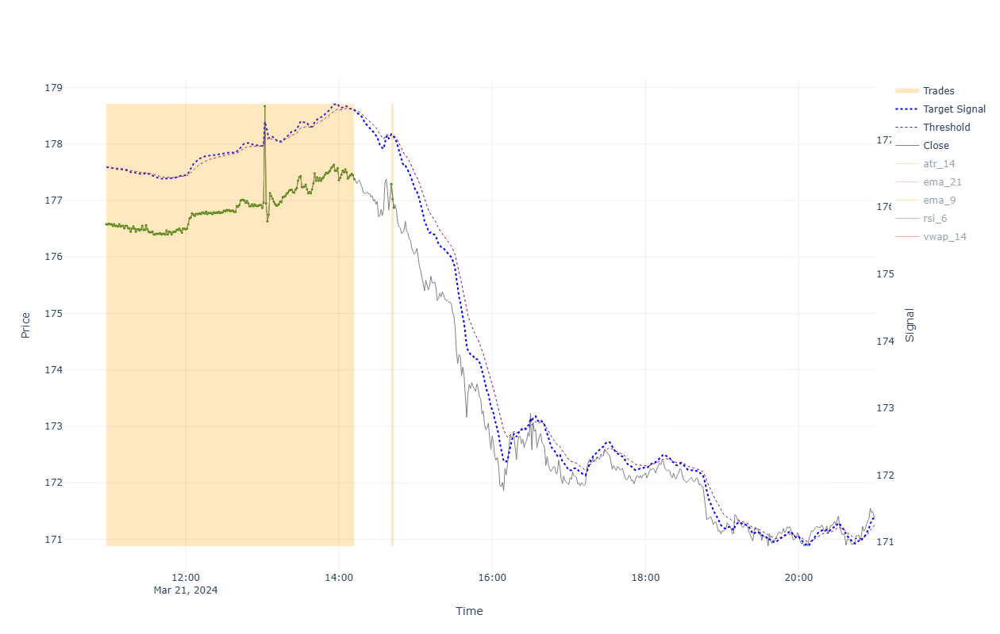


=== Performance for 2024-03-21 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.356 - Ask(0) 177.465 - Fee(0) [0.004+0.028] = -6.142
TRADES:
  Bid(1) 177.345 - Ask(1) 178.079 - Fee(1) [0.0+0.029] = -0.764
  Bid(2) 176.84 - Ask(2) 177.325 - Fee(2) [0.004+0.029] = -0.518
STRATEGY:
  Trade(1) -0.764 + Trade(2) -0.518 = -1.282

------------------------------------------------------------------------------------------------------------------------



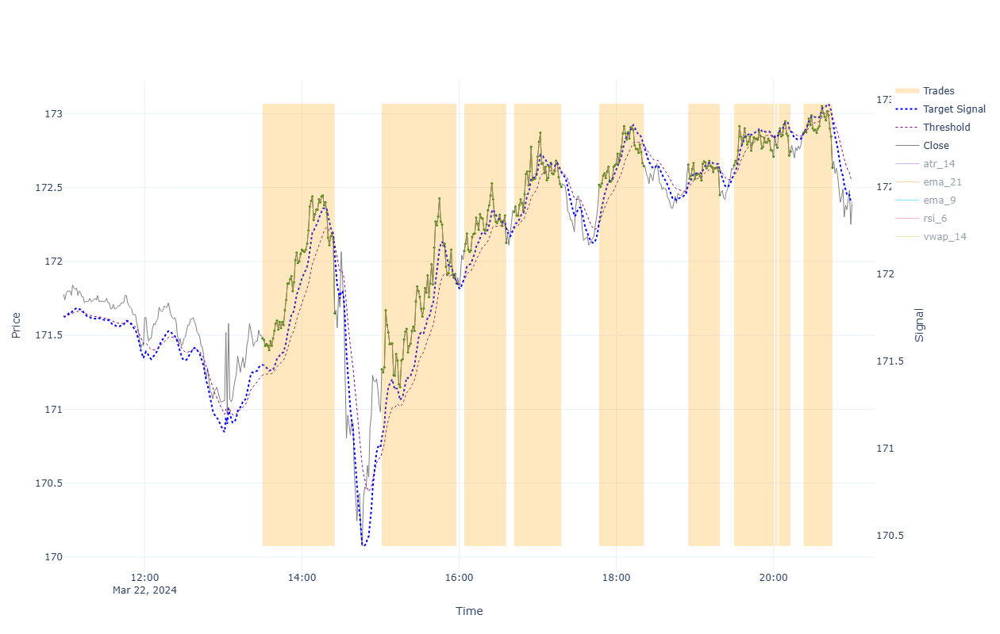


=== Performance for 2024-03-22 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.356 - Ask(0) 171.514 - Fee(0) [0.004+0.028] = 0.809
TRADES:
  Bid(1) 171.616 - Ask(1) 171.514 - Fee(1) [0.004+0.028] = 0.069
  Bid(2) 171.816 - Ask(2) 171.304 - Fee(2) [0.004+0.028] = 0.479
  Bid(3) 172.092 - Ask(3) 172.104 - Fee(3) [0.004+0.028] = -0.045
  Bid(4) 172.47 - Ask(4) 172.369 - Fee(4) [0.004+0.028] = 0.069
  Bid(5) 172.61 - Ask(5) 172.553 - Fee(5) [0.004+0.028] = 0.026
  Bid(6) 172.416 - Ask(6) 172.69 - Fee(6) [0.004+0.028] = -0.306
  Bid(7) 172.675 - Ask(7) 172.685 - Fee(7) [0.004+0.028] = -0.041
  Bid(8) 172.735 - Ask(8) 172.874 - Fee(8) [0.004+0.028] = -0.171
  Bid(9) 172.709 - Ask(9) 172.905 - Fee(9) [0.004+0.028] = -0.228
  Bid(10) 172.6 - Ask(10) 172.905 - Fee(10) [0.004+0.028] = -0.336
STRATEGY:
  Trade(1) 0.069 + Trade(2) 0.479 + Trade(3) -0.045 + Trade(4) 0.069 + Trade(5) 0.026 + Trade(6) -0.306 + Trade(7) -0.041 + Trade(8) -0.171 + Trade(9) -0.228 + Trade(10) -0.336 = -0.484

--------------------

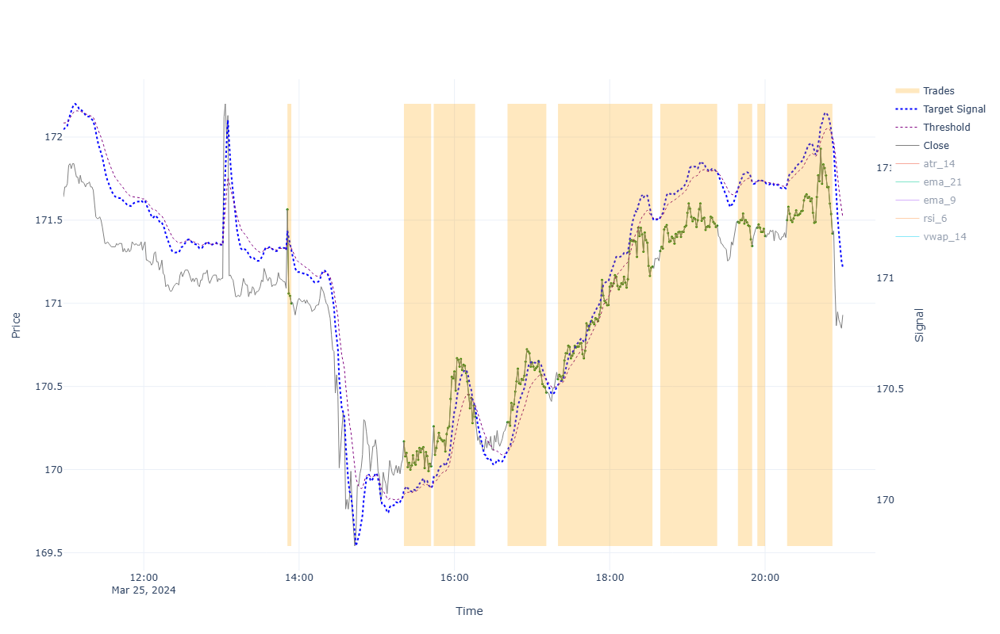


=== Performance for 2024-03-25 00:00:00 ===

BUY&HOLD:
  Bid(0) 170.896 - Ask(0) 171.134 - Fee(0) [0.004+0.028] = -0.27
TRADES:
  Bid(1) 170.966 - Ask(1) 171.599 - Fee(1) [0.004+0.028] = -0.665
  Bid(2) 169.986 - Ask(2) 170.203 - Fee(2) [0.004+0.028] = -0.249
  Bid(3) 170.284 - Ask(3) 170.294 - Fee(3) [0.004+0.028] = -0.041
  Bid(4) 170.429 - Ask(4) 170.319 - Fee(4) [0.004+0.028] = 0.079
  Bid(5) 171.186 - Ask(5) 170.579 - Fee(5) [0.004+0.028] = 0.575
  Bid(6) 171.433 - Ask(6) 171.349 - Fee(6) [0.004+0.028] = 0.052
  Bid(7) 171.311 - Ask(7) 171.524 - Fee(7) [0.004+0.028] = -0.245
  Bid(8) 171.371 - Ask(8) 171.489 - Fee(8) [0.004+0.028] = -0.15
  Bid(9) 171.386 - Ask(9) 171.534 - Fee(9) [0.004+0.028] = -0.18
STRATEGY:
  Trade(1) -0.665 + Trade(2) -0.249 + Trade(3) -0.041 + Trade(4) 0.079 + Trade(5) 0.575 + Trade(6) 0.052 + Trade(7) -0.245 + Trade(8) -0.15 + Trade(9) -0.18 = -0.824

---------------------------------------------------------------------------------------------------------

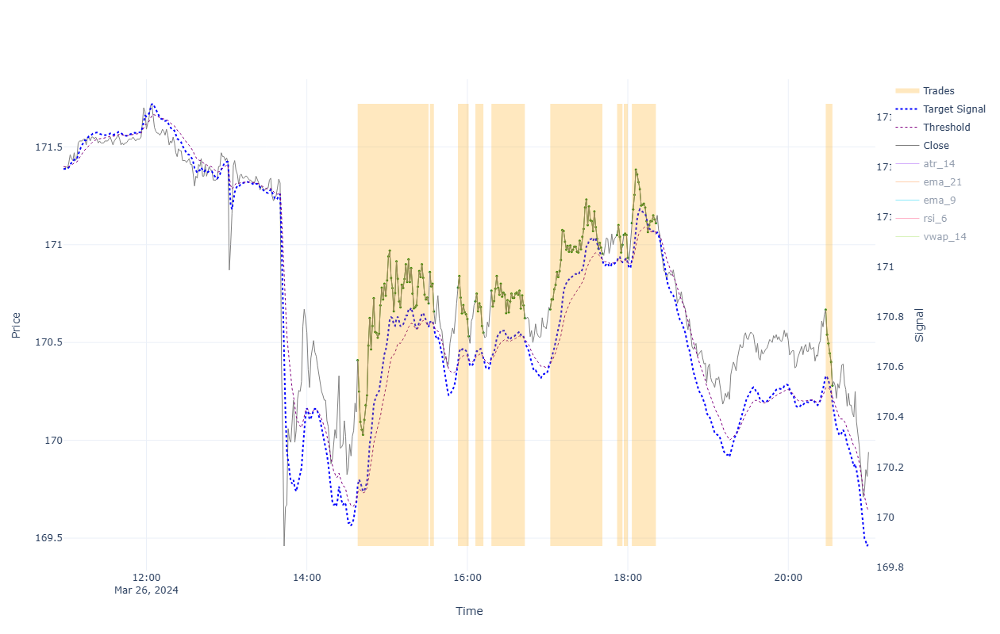


=== Performance for 2024-03-26 00:00:00 ===

BUY&HOLD:
  Bid(0) 169.906 - Ask(0) 171.324 - Fee(0) [0.004+0.028] = -1.45
TRADES:
  Bid(1) 170.666 - Ask(1) 170.444 - Fee(1) [0.004+0.028] = 0.19
  Bid(2) 170.625 - Ask(2) 170.894 - Fee(2) [0.004+0.028] = -0.301
  Bid(3) 170.498 - Ask(3) 170.814 - Fee(3) [0.004+0.028] = -0.347
  Bid(4) 170.516 - Ask(4) 170.744 - Fee(4) [0.004+0.028] = -0.26
  Bid(5) 170.591 - Ask(5) 170.799 - Fee(5) [0.004+0.028] = -0.24
  Bid(6) 170.92 - Ask(6) 170.704 - Fee(6) [0.004+0.028] = 0.184
  Bid(7) 170.966 - Ask(7) 171.084 - Fee(7) [0.004+0.028] = -0.15
  Bid(8) 170.899 - Ask(8) 171.084 - Fee(8) [0.004+0.028] = -0.217
  Bid(9) 171.076 - Ask(9) 171.144 - Fee(9) [0.004+0.028] = -0.1
  Bid(10) 170.246 - Ask(10) 170.702 - Fee(10) [0.004+0.028] = -0.488
STRATEGY:
  Trade(1) 0.19 + Trade(2) -0.301 + Trade(3) -0.347 + Trade(4) -0.26 + Trade(5) -0.24 + Trade(6) 0.184 + Trade(7) -0.15 + Trade(8) -0.217 + Trade(9) -0.1 + Trade(10) -0.488 = -1.729

------------------------

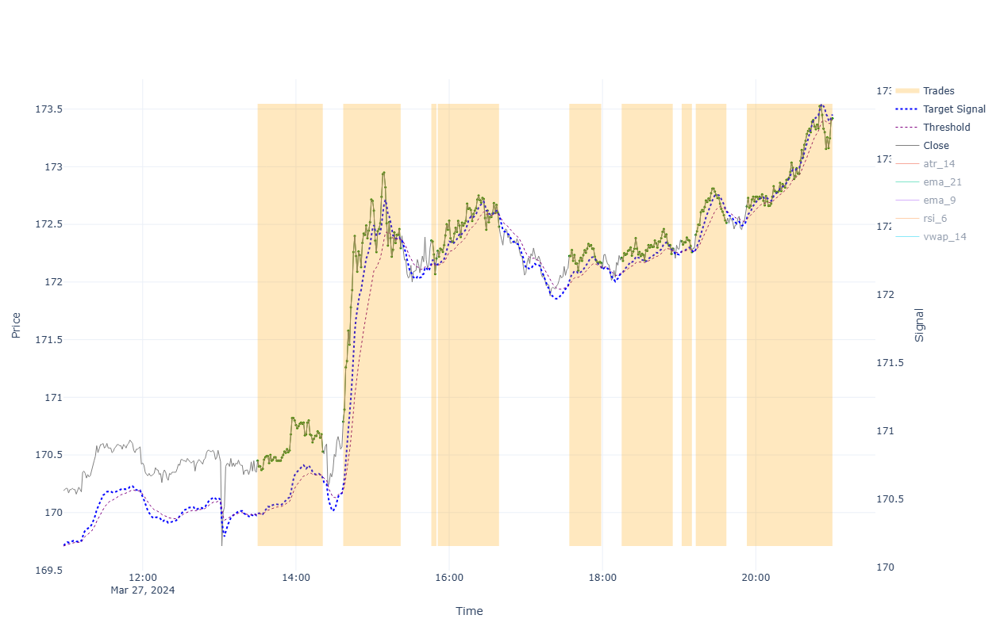


=== Performance for 2024-03-27 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.385 - Ask(0) 170.484 - Fee(0) [0.004+0.028] = 2.869
TRADES:
  Bid(1) 170.496 - Ask(1) 170.484 - Fee(1) [0.004+0.028] = -0.02
  Bid(2) 172.261 - Ask(2) 170.824 - Fee(2) [0.004+0.028] = 1.404
  Bid(3) 172.171 - Ask(3) 172.394 - Fee(3) [0.004+0.028] = -0.256
  Bid(4) 172.446 - Ask(4) 172.304 - Fee(4) [0.004+0.028] = 0.109
  Bid(5) 172.131 - Ask(5) 172.259 - Fee(5) [0.004+0.028] = -0.161
  Bid(6) 172.256 - Ask(6) 172.244 - Fee(6) [0.004+0.028] = -0.021
  Bid(7) 172.226 - Ask(7) 172.389 - Fee(7) [0.004+0.028] = -0.196
  Bid(8) 172.48 - Ask(8) 172.444 - Fee(8) [0.004+0.028] = 0.004
  Bid(9) 173.385 - Ask(9) 172.69 - Fee(9) [0.004+0.0] = 0.692
STRATEGY:
  Trade(1) -0.02 + Trade(2) 1.404 + Trade(3) -0.256 + Trade(4) 0.109 + Trade(5) -0.161 + Trade(6) -0.021 + Trade(7) -0.196 + Trade(8) 0.004 + Trade(9) 0.692 = 1.555

--------------------------------------------------------------------------------------------------------------

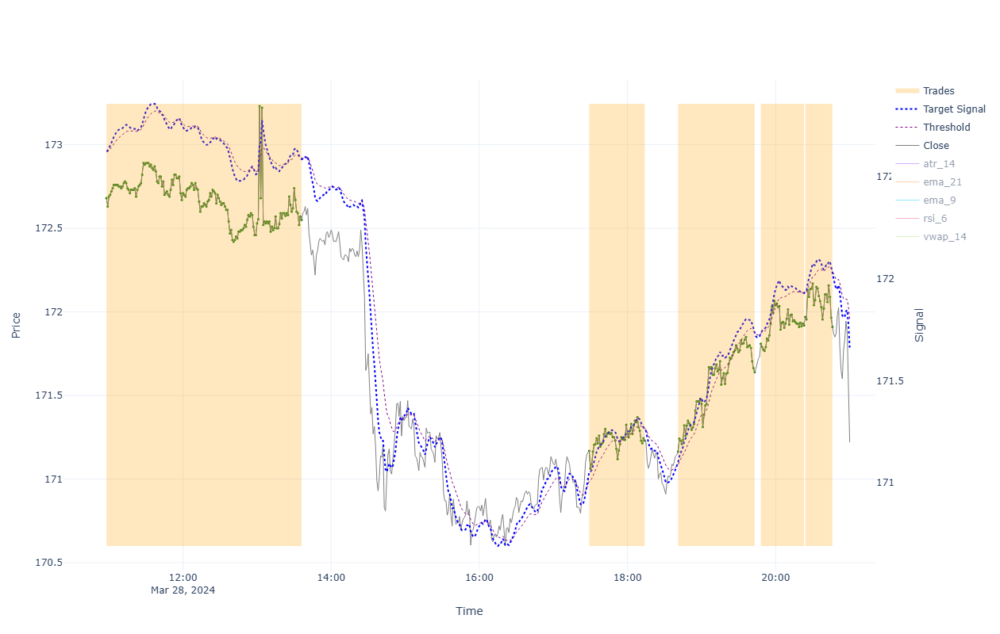


=== Performance for 2024-03-28 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.186 - Ask(0) 172.775 - Fee(0) [0.004+0.028] = -1.621
TRADES:
  Bid(1) 172.515 - Ask(1) 173.385 - Fee(1) [0.0+0.028] = -0.898
  Bid(2) 171.196 - Ask(2) 171.203 - Fee(2) [0.004+0.028] = -0.04
  Bid(3) 171.606 - Ask(3) 171.199 - Fee(3) [0.004+0.028] = 0.375
  Bid(4) 171.886 - Ask(4) 171.844 - Fee(4) [0.004+0.028] = 0.009
  Bid(5) 171.876 - Ask(5) 172.004 - Fee(5) [0.004+0.028] = -0.16
STRATEGY:
  Trade(1) -0.898 + Trade(2) -0.04 + Trade(3) 0.375 + Trade(4) 0.009 + Trade(5) -0.16 = -0.714

------------------------------------------------------------------------------------------------------------------------


Overall Summary (2024-03-01 = 178.976 → 2024-03-28 = 171.186)
Num. trading days: 20
Trades Count: 139

One-Time B&H gain: -7.790
Sum Strategy gain: -11.202
Sum Intraday B&H gain: -8.685

One-Time B&H gain per day: -0.3895
Strategy gain per day: -0.5601
Strategy gain per trade: -0.0806


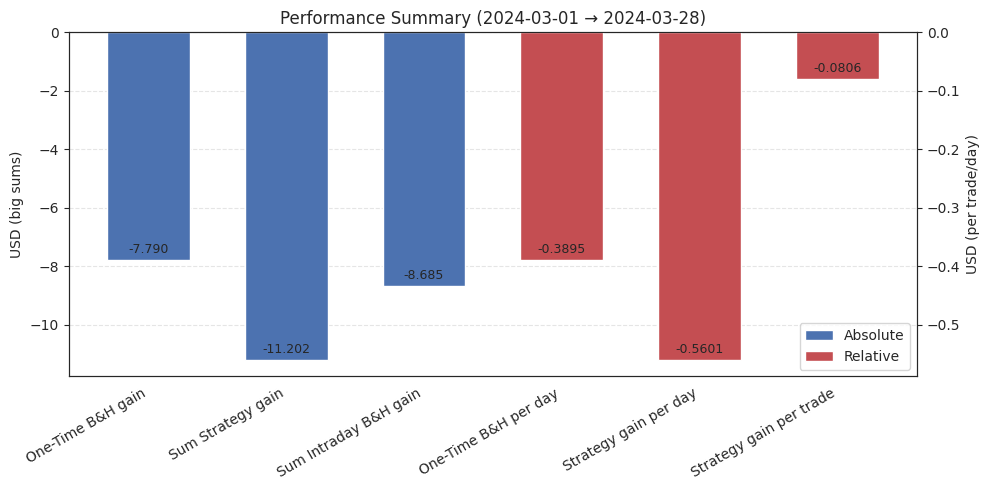


Overall Summary (2022-12-23 = 132.533 → 2025-06-18 = 196.501)
Num. trading days: 622
Trades Count: 4751

One-Time B&H gain: 63.968
Sum Strategy gain: -582.249
Sum Intraday B&H gain: 63.254

One-Time B&H gain per day: 0.1028
Strategy gain per day: -0.9361
Strategy gain per trade: -0.1226


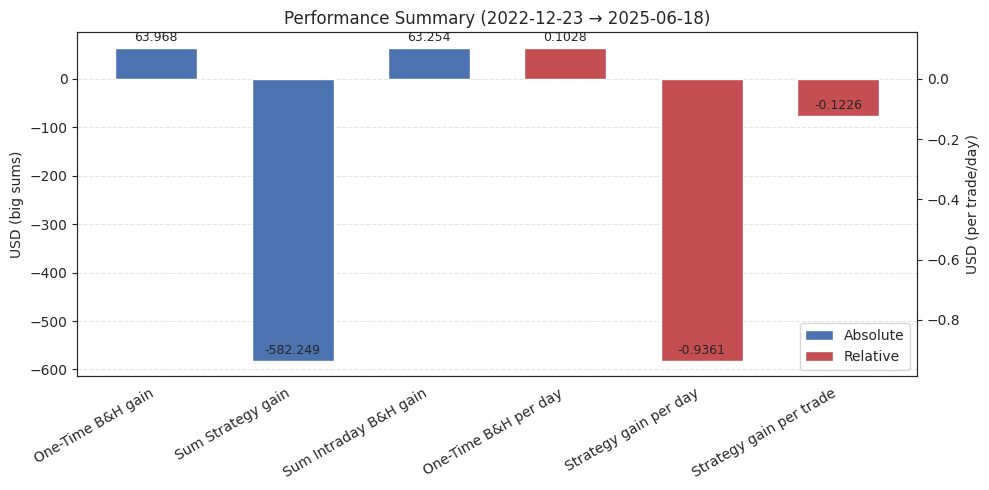

In [9]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]
feats_inds = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14']

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df = df_day,
            col_signal1 = "ema_9",
            sign_thresh = "ema_21", 
            trades = trades_day,
            performance_stats = stats_day,
            features = feats_inds,
            autoscale = False,
            extra_hover_fields = ['vwap_14', 'rsi_6', 'atr_14']
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance([sim_results[d][2] for d in sorted(days_in_month)], df_month)
plots.aggregate_performance([sim_results[d][2] for d in sorted(sim_results)], df_inds_test)
